# E9 213 Time Frequency Analysis - Assignment 3
***
*Submitted by: Dwaipayan Haldar*<br>
*S.R. No. : 27128*

<div style="padding:10px; background-color:#ffe6e6;">
  Here, I have used ipywidgets's interact tool to make interactive slider for problem number 5 and 6. In order to run in any other system, one must install ipywidgets in their current environment. <a href="https://ipywidgets.readthedocs.io/en/latest/user_install.html">Here</a> is how to install it. 
</div>

In [9]:
#Importing the libraries

import numpy as np
import matplotlib.pyplot as plt
from tftb.processing import PseudoWignerVilleDistribution, ShortTimeFourierTransform, WignerVilleDistribution 
import ipywidgets as widgets
from ipywidgets import interact,fixed
from scipy.signal import windows
import scipy.io as sio
import librosa
import h5py
from scipy.signal import decimate

### Problem 1: Computing the Spectrogram and WVD

In [10]:
#Defining the Functions 

def sin(w_0 = 2*np.pi*50):
    t = np.arange(0,10,0.005)
    x = np.sin(w_0*t)
    return t,x

def gaussian(sigma = 1):
    t = np.arange(0,10,0.005)
    x = np.exp(-((t-5)/sigma)**2)
    return t,x

def linear_chirp():
    t = np.arange(0,10,0.005)
    f0, f1 = 5, 50
    T = t[-1] - t[0]
    w_0 = 2 * np.pi * (f0 + (f1 - f0) * t / (2 * T))
    x = np.sin(w_0*t)
    return t, x

def gabor(sigma = 1, w_0 = 2*np.pi*50):
    t = np.arange(0, 10, 0.005)
    _ , x_1 = sin(w_0)
    _, x_2 = gaussian(sigma)
    x = x_1*x_2
    return t,x
 

#### Problem 1a: Spectrogram(The Bartlett Window)

In [11]:
#Spectrogram with Bartlett Window

def plot(func, overlap = 1, window_length = 250):
    t, x = func()
    stft = ShortTimeFourierTransform(x, t[::overlap], fwindow=np.bartlett(window_length))
    stft.run()

    S = np.abs(stft.tfr)
    n_f, n_t = S.shape
    f_s = 1/(t[1]-t[0])
    F = np.linspace(0,f_s, n_f)
    T = np.linspace(t[0], t[-1], n_t)

    S_dB = 20 * np.log10(S / np.max(S) + 1e-12) 

    plt.figure(figsize=(12,8))
    plt.pcolormesh(T, F, S_dB, shading = 'auto', cmap = 'plasma')
    plt.colorbar(label = "Magnitude(dB)")
    plt.title(F"Short Time Fourier Transform({func.__name__})", fontsize = 14)
    plt.xlabel(f"Time(s) (Scale: 1 unit = {10/n_t} s)", fontsize = 12)
    plt.ylabel("Frequency (Hz) (Scale: 1 unit = 0.1Hz)", fontsize = 12)
    plt.ylim(0, f_s/2)
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f"{func.__name__}_{overlap}_{window_length}.png")
    plt.show()
    print(f"Size of the matrix is {n_f}*{n_t}")


interact(plot, func = fixed(sin), window_length=widgets.FloatSlider(min=50, max=500, step=50, description='WL'), overlap = widgets.IntSlider(min=1, max = 100, step = 5, description = 'WL - Overlap' ))
interact(plot, func = fixed(gaussian), window_length=widgets.FloatSlider(min=50, max=500, step=50, description='WL'), overlap = widgets.IntSlider(min=1, max = 100, step = 5, description = 'WL - Overlap' ))
interact(plot, func = fixed(linear_chirp), window_length=widgets.FloatSlider(min=50, max=500, step=50, description='WL'), overlap = widgets.IntSlider(min=1, max = 100, step = 5, description = 'WL - Overlap' ))
interact(plot, func = fixed(gabor), window_length=widgets.FloatSlider(min=50, max=500, step=50, description='WL'), overlap = widgets.IntSlider(min=1, max = 100, step = 5, description = 'WL - Overlap' ))


interactive(children=(IntSlider(value=1, description='WL - Overlap', min=1, step=5), FloatSlider(value=50.0, d…

interactive(children=(IntSlider(value=1, description='WL - Overlap', min=1, step=5), FloatSlider(value=50.0, d…

interactive(children=(IntSlider(value=1, description='WL - Overlap', min=1, step=5), FloatSlider(value=50.0, d…

interactive(children=(IntSlider(value=1, description='WL - Overlap', min=1, step=5), FloatSlider(value=50.0, d…

<function __main__.plot(func, overlap=1, window_length=250)>

#### Problem 1a: Spectrogram(The Gaussian Window)

In [ ]:
#Spectrogram with the Gaussian Window

def plot(func, overlap = 1, window_length = 250):
    t, x = func()
    stft = ShortTimeFourierTransform(x, t[::overlap], fwindow=windows.gaussian(window_length, std= 10))
    stft.run()

    S = np.abs(stft.tfr)
    n_f, n_t = S.shape
    f_s = 1/(t[1]-t[0])
    F = np.linspace(0,f_s, n_f)
    T = np.linspace(t[0], t[-1], n_t)

    S_dB = 20 * np.log10(S / np.max(S) + 1e-12) 

    plt.figure(figsize=(12,8))
    plt.pcolormesh(T, F, S_dB, shading = 'auto', cmap = 'plasma')
    plt.colorbar(label = "Magnitude(dB)")
    plt.title(F"Short Time Fourier Transform({func.__name__})", fontsize = 14)
    plt.xlabel(f"Time(s) (Scale: 1 unit = {10/n_t} s)", fontsize = 12)
    plt.ylabel("Frequency (Hz) (Scale: 1 unit = 0.1Hz)", fontsize = 12)
    plt.ylim(0, f_s/2)
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f"Gau_Win_{func.__name__}_{overlap}_{window_length}.png")
    plt.show()
    print(f"Size of the matrix is {n_f}*{n_t}")


interact(plot, func = fixed(sin), window_length=widgets.FloatSlider(min=50, max=500, step=50, description='WL'), overlap = widgets.IntSlider(min=1, max = 100, step = 5, description = 'WL - Overlap' ))
interact(plot, func = fixed(gaussian), window_length=widgets.FloatSlider(min=50, max=500, step=50, description='WL'), overlap = widgets.IntSlider(min=1, max = 100, step = 5, description = 'WL - Overlap' ))
interact(plot, func = fixed(linear_chirp), window_length=widgets.FloatSlider(min=50, max=500, step=50, description='WL'), overlap = widgets.IntSlider(min=1, max = 100, step = 5, description = 'WL - Overlap' ))
interact(plot, func = fixed(gabor), window_length=widgets.FloatSlider(min=50, max=500, step=50, description='WL'), overlap = widgets.IntSlider(min=1, max = 100, step = 5, description = 'WL - Overlap' ))

interactive(children=(IntSlider(value=1, description='WL - Overlap', min=1, step=5), FloatSlider(value=50.0, d…

interactive(children=(IntSlider(value=1, description='WL - Overlap', min=1, step=5), FloatSlider(value=50.0, d…

interactive(children=(IntSlider(value=1, description='WL - Overlap', min=1, step=5), FloatSlider(value=50.0, d…

interactive(children=(IntSlider(value=1, description='WL - Overlap', min=1, step=5), FloatSlider(value=50.0, d…

<function __main__.plot(func, overlap=1, window_length=250)>

#### Problem 1b: The Wigner-Ville Distribution

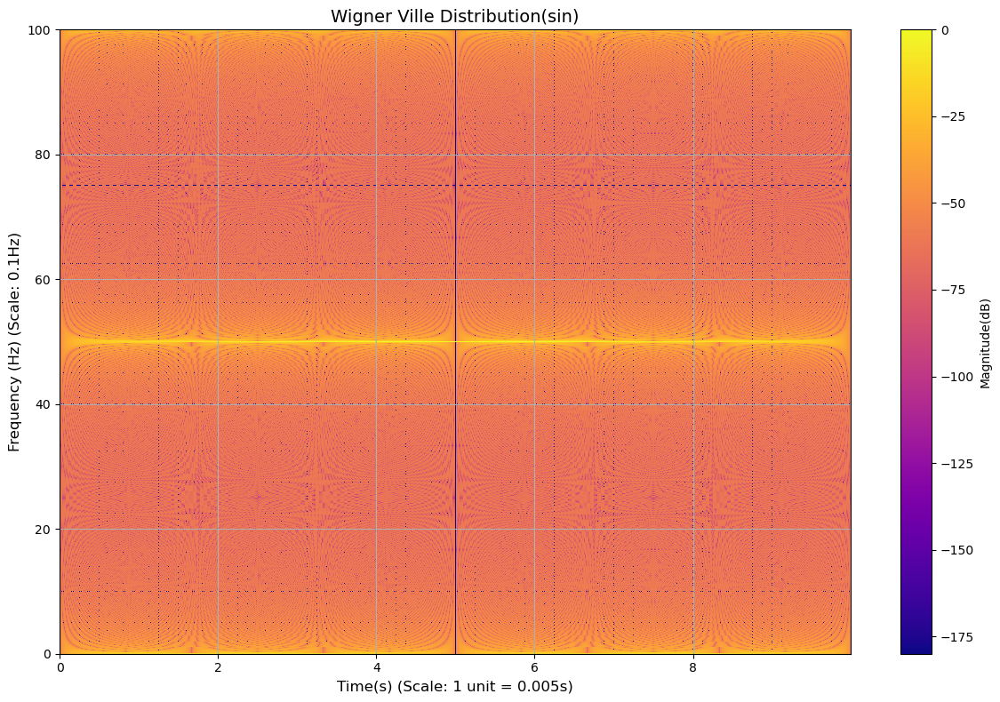

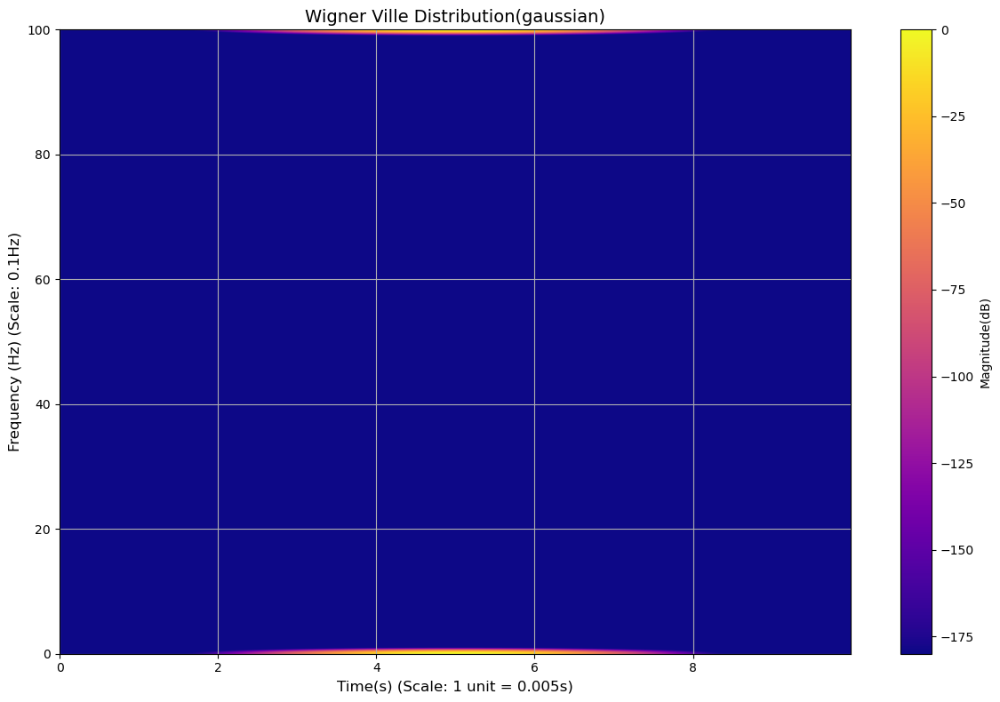

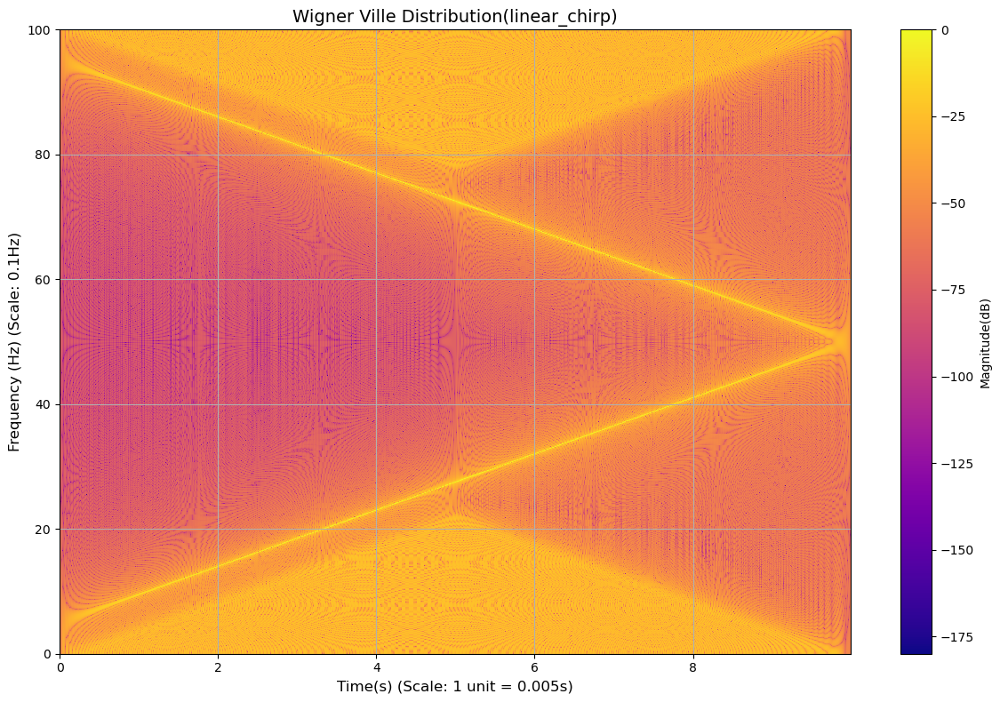

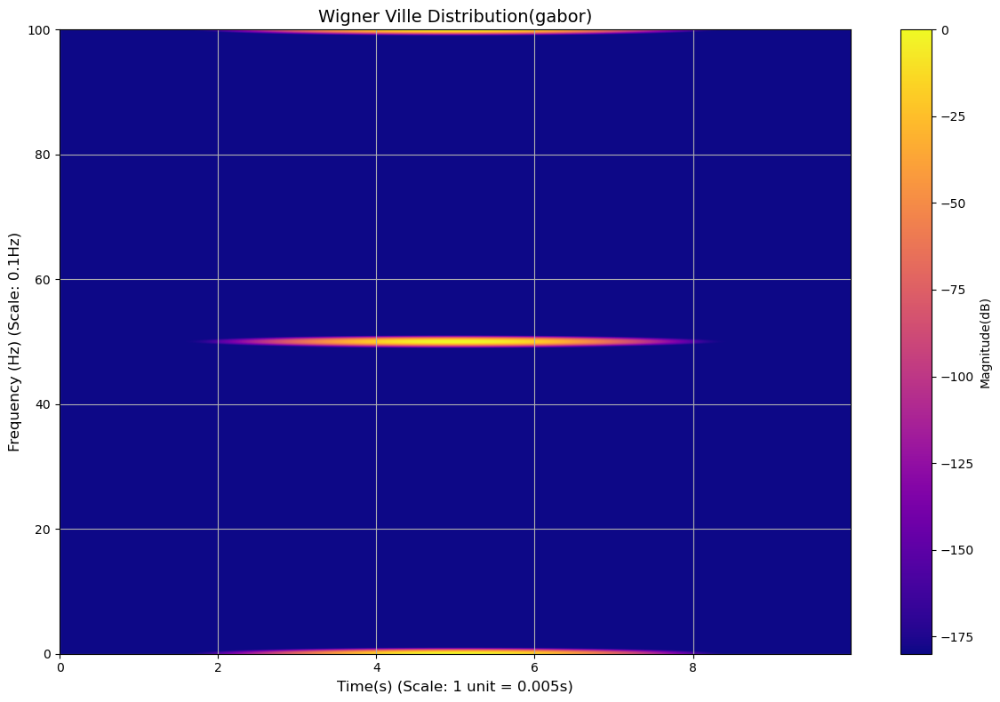

In [15]:
def plot_wvd(func):
    t, x = func()
    wvd = WignerVilleDistribution(x, t)
    wvd.run()

    S = np.abs(wvd.tfr)
    n_f, n_t = S.shape
    f_s = 1/(t[1]-t[0])
    F = np.linspace(0,f_s/2, n_f)
    T = np.linspace(t[0], t[-1], n_t)

    S_dB = 20 * np.log10(S / np.max(S) + 1e-9) 

    plt.figure(figsize=(12,8))
    plt.pcolormesh(T, F, S_dB, shading = 'auto', cmap = 'plasma')
    plt.colorbar(label = "Magnitude(dB)")
    plt.title(F"Wigner Ville Distribution({func.__name__})", fontsize = 14)
    plt.xlabel("Time(s) (Scale: 1 unit = 0.005s)", fontsize = 12)
    plt.ylabel("Frequency (Hz) (Scale: 0.1Hz)", fontsize = 12)
    plt.ylim(0, f_s/2)
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f"{func.__name__}_wvd.png")
    plt.show()

plot_wvd(sin)
plot_wvd(gaussian)
plot_wvd(linear_chirp)
plot_wvd(gabor)


### Problem 2: STFT and WVD of different real life signals

#### Problem 2a: EEG Signal

In [34]:
eeg_data = sio.loadmat('Dataset_for_A3/EEG/eegDataAll.mat')

all_eeg_data = eeg_data['eegDataAll'][0]
t = eeg_data['timeVals'].T
t = t.squeeze()
avg_1cond_data = {}

for i in range(8):
    avg_1cond_data[i] = np.average(all_eeg_data[i], axis =1)[0]

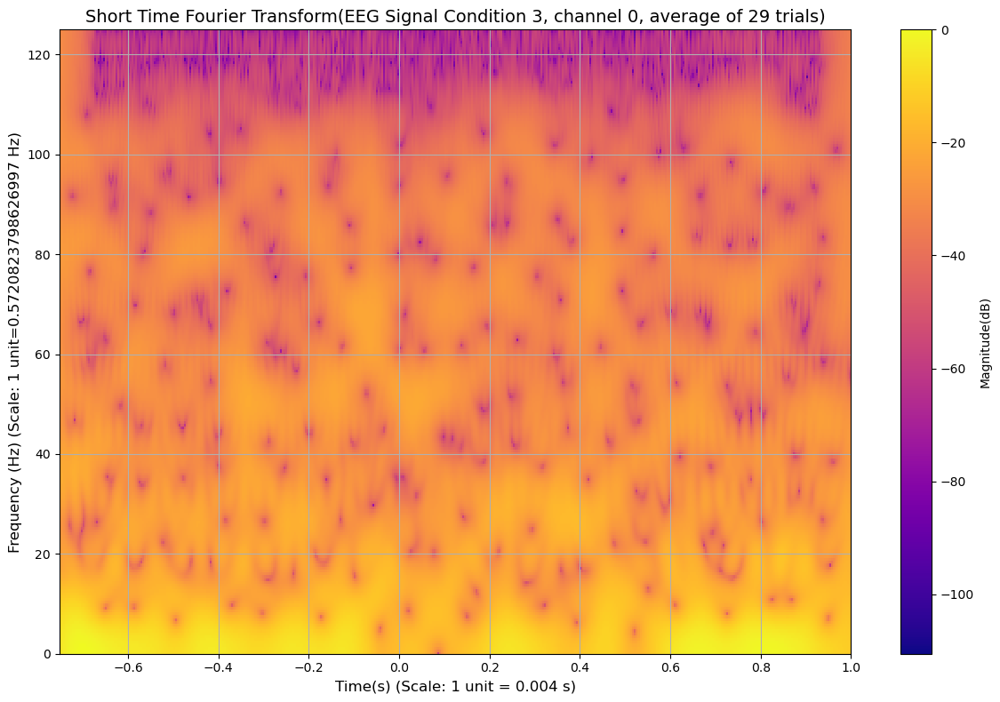

In [38]:
stft = ShortTimeFourierTransform(avg_1cond_data[3], t, fwindow=np.bartlett(40))
stft.run()

S = np.abs(stft.tfr)
n_f, n_t = S.shape
f_s = 1/(t[1]-t[0])
F = np.linspace(0,f_s, n_f)
T = np.linspace(t[0], t[-1], n_t)

S_dB = 20 * np.log10(S / np.max(S) + 1e-12) 

plt.figure(figsize=(12,8))
plt.pcolormesh(T, F, S_dB, shading = 'auto', cmap = 'plasma')
plt.colorbar(label = "Magnitude(dB)")
plt.title(F"Short Time Fourier Transform(EEG Signal Condition 3, channel 0, average of 29 trials)", fontsize = 14)
plt.xlabel("Time(s) (Scale: 1 unit = 0.004 s)", fontsize = 12)
plt.ylabel("Frequency (Hz) (Scale: 1 unit=0.5720823798626997 Hz)", fontsize = 12)
plt.ylim(0, f_s/2)
plt.grid(True)
plt.tight_layout()
plt.savefig("eegsignal_stft.png")
plt.show()

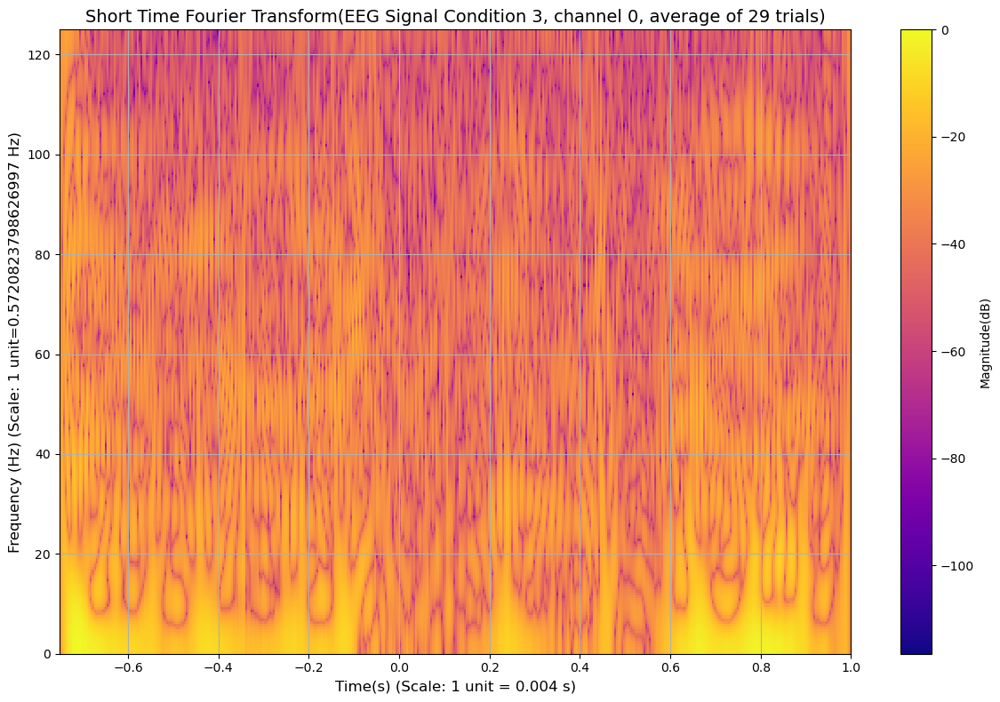

In [39]:
pseudo_wvd = PseudoWignerVilleDistribution(avg_1cond_data[3], t, fwindow=np.bartlett(40))
pseudo_wvd.run()

S = np.abs(pseudo_wvd.tfr)
n_f, n_t = S.shape
f_s = 1/(t[1]-t[0])
F = np.linspace(0,f_s, n_f)
T = np.linspace(t[0], t[-1], n_t)

S_dB = 20 * np.log10(S / np.max(S) + 1e-12) 

plt.figure(figsize=(12,8))
plt.pcolormesh(T, F, S_dB, shading = 'auto', cmap = 'plasma')
plt.colorbar(label = "Magnitude(dB)")
plt.title(F"Short Time Fourier Transform(EEG Signal Condition 3, channel 0, average of 29 trials)", fontsize = 14)
plt.xlabel("Time(s) (Scale: 1 unit = 0.004 s)", fontsize = 12)
plt.ylabel("Frequency (Hz) (Scale: 1 unit=0.5720823798626997 Hz)", fontsize = 12)
plt.ylim(0, f_s/2)
plt.grid(True)
plt.tight_layout()
plt.savefig("eegsignal_pwvd.png")
plt.show()

#### Problem 2b: LIGO Signal

In [ ]:
ligo_signal = h5py.File('Dataset_for_A3/LIGO/H-H1_GWOSC_4KHZ_R1-1126257415-4096.hdf5', 'r')

ligo_signal_samples = ligo_signal['strain']['Strain']
ligo_signal_samples = decimate(ligo_signal_samples,32)

(524288,)

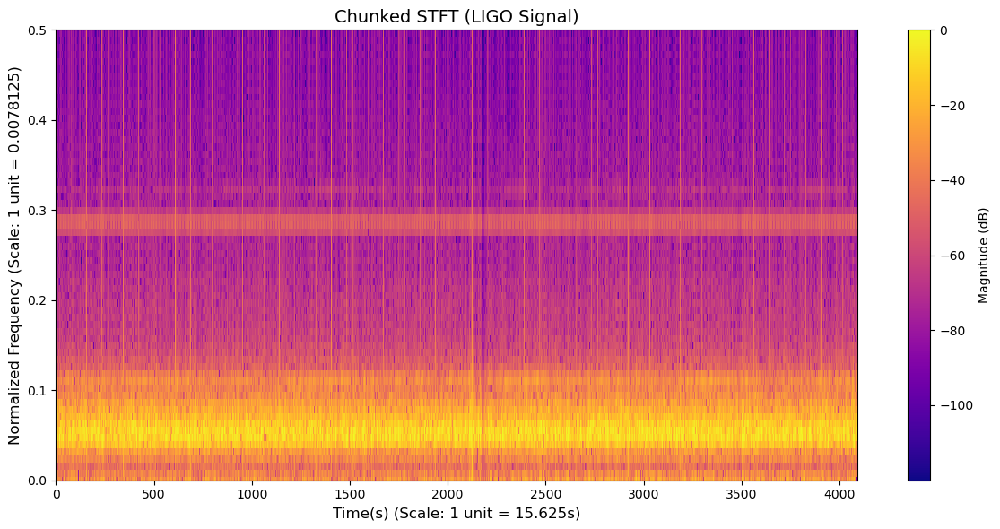

In [28]:
signal = ligo_signal_samples
chunk_size = 2000
nfft = 128
window = windows.bartlett(128)
n_samples = len(signal)
global_max = np.max(np.abs(signal))

step = chunk_size
num_chunks = (n_samples) // step

tfr_all = []

for i in range(num_chunks):
    start = i * step
    end = start + chunk_size
    if end > n_samples:
        break
    x_chunk = signal[start:end]
    stft = ShortTimeFourierTransform(x_chunk, fwindow=window, n_fbins=nfft)
    stft.run()
    S = np.abs(stft.tfr)
    max_val = np.max(S)
    S_dB = 20 * np.log10(S /max_val+ 1e-6)
    
    tfr_all.append(S_dB)  

S_full = np.hstack(tfr_all)
F = np.linspace(0, 1, S_full.shape[0])
T = np.arange(S_full.shape[1])/128

plt.figure(figsize=(12,6))
plt.pcolormesh(T, F, S_full, shading='auto', cmap='plasma')
plt.colorbar(label="Magnitude (dB)")
plt.title(f"Chunked STFT (LIGO Signal)", fontsize=14)
plt.xlabel("Time(s) (Scale: 1 unit = 15.625s)", fontsize=12)
plt.ylabel("Normalized Frequency (Scale: 1 unit = 0.0078125)", fontsize=12)
plt.ylim(0, 0.5)
plt.tight_layout()
plt.savefig("ligosignal_stft.png")
plt.show()

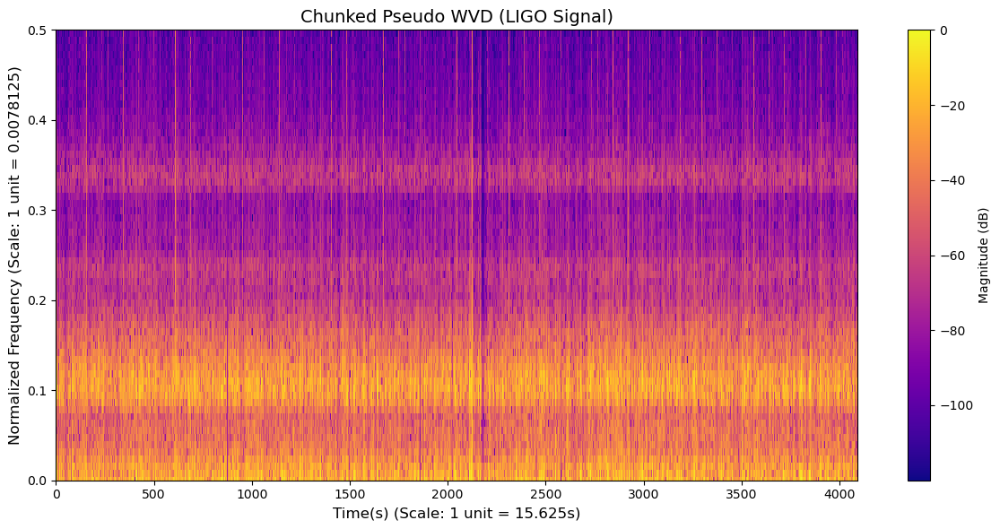

In [27]:
signal = ligo_signal_samples
chunk_size = 2000
nfft = 128
window = windows.bartlett(128)
n_samples = len(signal)
global_max = np.max(np.abs(signal))

step = chunk_size
num_chunks = (n_samples) // step

tfr_all = []

for i in range(num_chunks):
    start = i * step
    end = start + chunk_size
    if end > n_samples:
        break
    x_chunk = signal[start:end]
    pwvd = PseudoWignerVilleDistribution(x_chunk, fwindow=window, n_fbins=nfft)
    pwvd.run()
    S = np.abs(pwvd.tfr)
    max_val = np.max(S)
    S_dB = 20 * np.log10(S /max_val+ 1e-6)
    
    tfr_all.append(S_dB)  

S_full = np.hstack(tfr_all)
F = np.linspace(0, 1, S_full.shape[0])
T = np.arange(S_full.shape[1])/128

plt.figure(figsize=(12,6))
plt.pcolormesh(T, F, S_full, shading='auto', cmap='plasma')
plt.colorbar(label="Magnitude (dB)")
plt.title(f"Chunked Pseudo WVD (LIGO Signal)", fontsize=14)
plt.xlabel("Time(s) (Scale: 1 unit = 15.625s)", fontsize=12)
plt.ylabel("Normalized Frequency (Scale: 1 unit = 0.0078125)", fontsize=12)
plt.ylim(0, 0.5)
plt.tight_layout()
plt.savefig("ligosignal_pwvd.png")
plt.show()

#### Problem 2c: The mmWave Radar Signal

In [ ]:
mmWave = sio.loadmat('Dataset_for_A3/mmWave_RADAR/file/distance_sp_3.mat')

mmWave_samples = mmWave['samples'].T.squeeze()

mmWave_samples = decimate(mmWave_samples, 2)

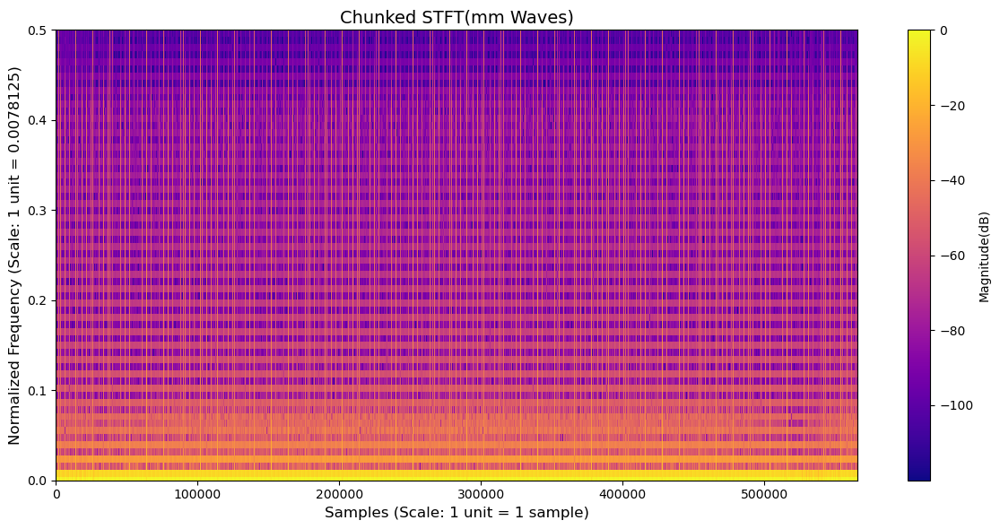

In [29]:
signal = mmWave_samples
chunk_size = 2000
nfft = 128
window = windows.bartlett(128)
n_samples = len(signal)
global_max = np.max(np.abs(signal))

step = chunk_size
num_chunks = (n_samples) // step

tfr_all = []

for i in range(num_chunks):
    start = i * step
    end = start + chunk_size
    if end > n_samples:
        break
    x_chunk = signal[start:end]
    stft = ShortTimeFourierTransform(x_chunk, fwindow=window, n_fbins=nfft)
    stft.run()
    S = np.abs(stft.tfr)
    max_val = np.max(S)
    S_dB = 20 * np.log10(S /max_val+ 1e-6)
    
    tfr_all.append(S_dB)  

S_full = np.hstack(tfr_all)
F = np.linspace(0, 1, S_full.shape[0])
T = np.arange(S_full.shape[1])

plt.figure(figsize=(12,6))
plt.pcolormesh(T, F, S_full, shading='auto', cmap='plasma')
plt.colorbar(label="Magnitude(dB)")
plt.title(f"Chunked STFT(mm Waves)", fontsize=14)
plt.xlabel("Samples (Scale: 1 unit = 1 sample)", fontsize=12)
plt.ylabel("Normalized Frequency (Scale: 1 unit = 0.0078125)", fontsize=12)
plt.ylim(0, 0.5)
plt.tight_layout()
plt.savefig("mmWaves_stft.png")
plt.show()

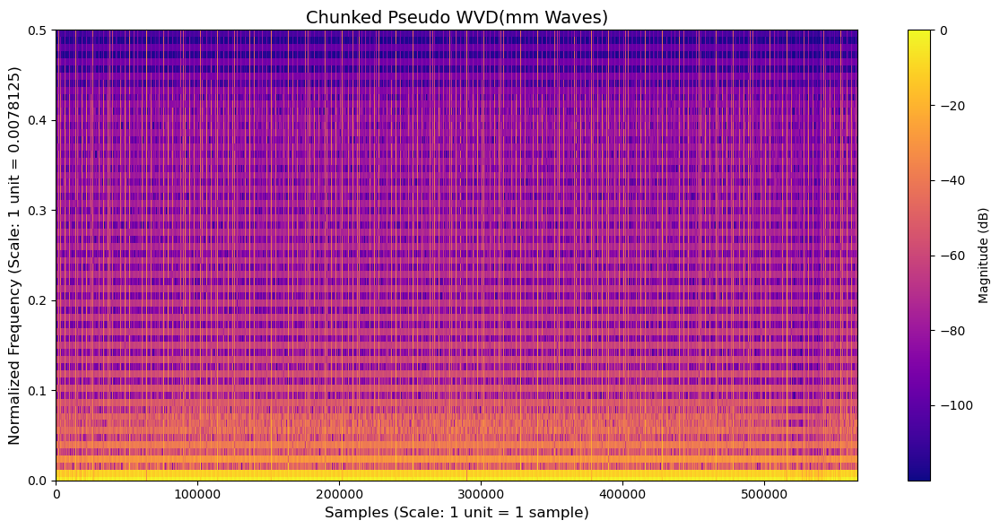

In [30]:
signal = mmWave_samples
chunk_size = 2000
nfft = 128
window = windows.bartlett(128)
n_samples = len(signal)
global_max = np.max(np.abs(signal))

step = chunk_size
num_chunks = (n_samples) // step

tfr_all = []

for i in range(num_chunks):
    start = i * step
    end = start + chunk_size
    if end > n_samples:
        break
    x_chunk = signal[start:end]
    pwvd = PseudoWignerVilleDistribution(x_chunk, fwindow=window, n_fbins=nfft)
    pwvd.run()
    S = np.abs(pwvd.tfr)
    max_val = np.max(S)
    S_dB = 20 * np.log10(S /max_val+ 1e-6)
    
    tfr_all.append(S_dB)  

S_full = np.hstack(tfr_all)
F = np.linspace(0, 1, S_full.shape[0])
T = np.arange(S_full.shape[1])

plt.figure(figsize=(12,6))
plt.pcolormesh(T, F, S_full, shading='auto', cmap='plasma')
plt.colorbar(label="Magnitude (dB)")
plt.title(f"Chunked Pseudo WVD(mm Waves)", fontsize=14)
plt.xlabel("Samples (Scale: 1 unit = 1 sample)", fontsize=12)
plt.ylabel("Normalized Frequency (Scale: 1 unit = 0.0078125)", fontsize=12)
plt.ylim(0, 0.5)
plt.tight_layout()
plt.savefig("mmWaves_pwvd.png")
plt.show()

#### Problem 2d: Music Signals

In [31]:
signal_diff_instruments = librosa.load("Dataset_for_A3/Music/Diff_Instruments.mp3")
signal_eddie_rabbit = librosa.load("Dataset_for_A3/Music/Eddie_Rabbit(Stereo).mp3")
signal_guitar = librosa.load("Dataset_for_A3/Music/Guitar.mp3")
signal_octaves = librosa.load("Dataset_for_A3/Music/Octaves.mp3")
signal_patterns = librosa.load("Dataset_for_A3/Music/Patterns.mp3")
signal_solos = librosa.load("Dataset_for_A3/Music/Solos.mp3")

signals_data = {
    'diff_instruments': signal_diff_instruments[0],
    'eddie_rabbit': signal_eddie_rabbit[0],
    'guitar': signal_guitar[0],
    'octaves': signal_octaves[0],
    'patterns': signal_patterns[0],
    'solos': signal_solos[0]
}

/var/folders/lp/166gmbq56sb3m0xjhm19215w0000gn/T/ipykernel_27931/2750772226.py:26: RuntimeWarning: invalid value encountered in divide
  S_dB = 20 * np.log10(S /max_val+ 1e-6)


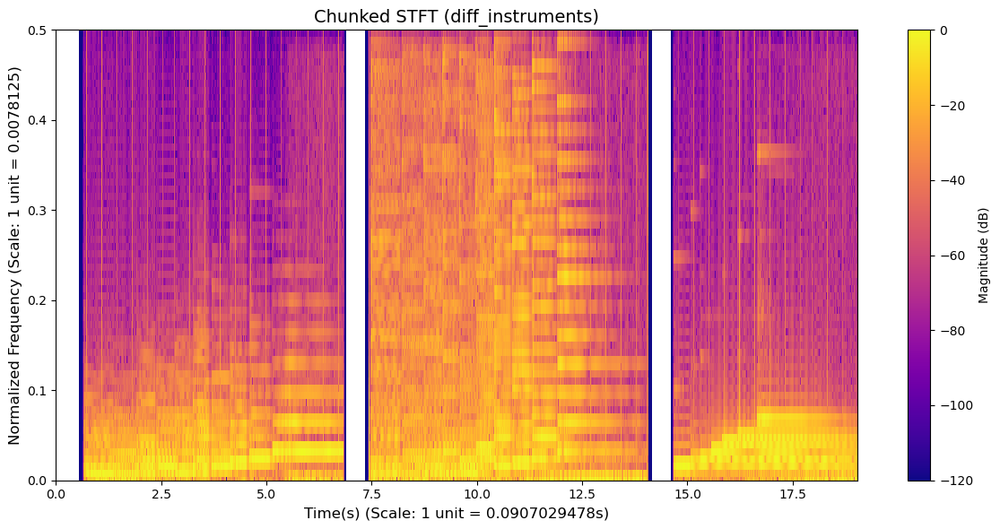

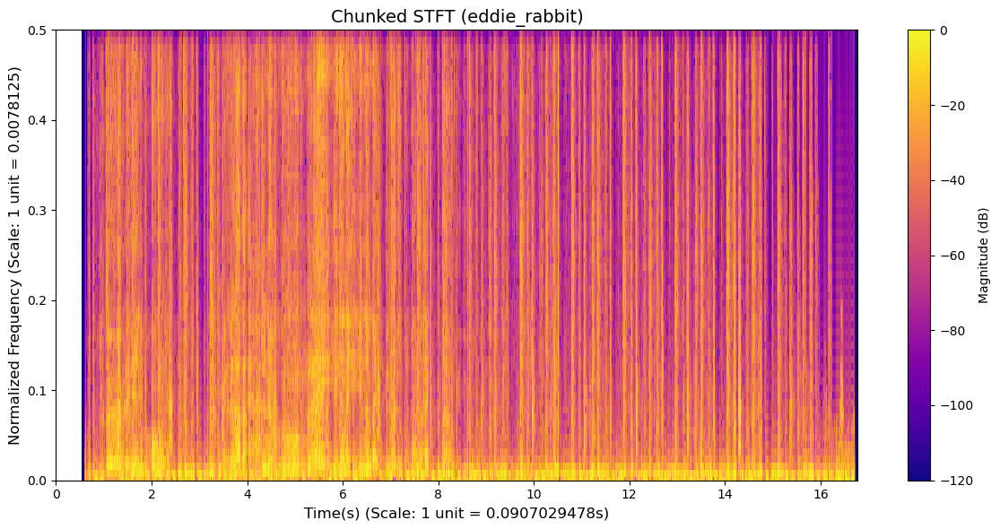

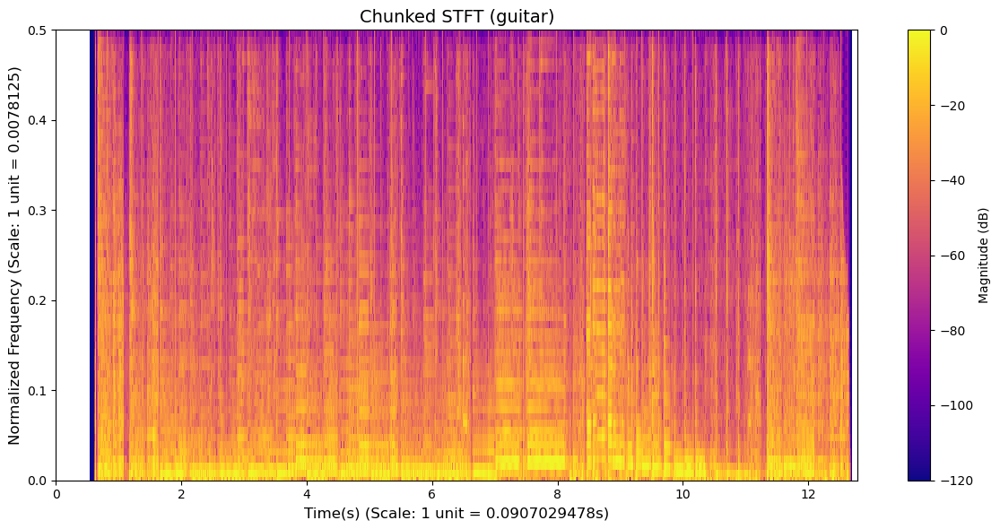

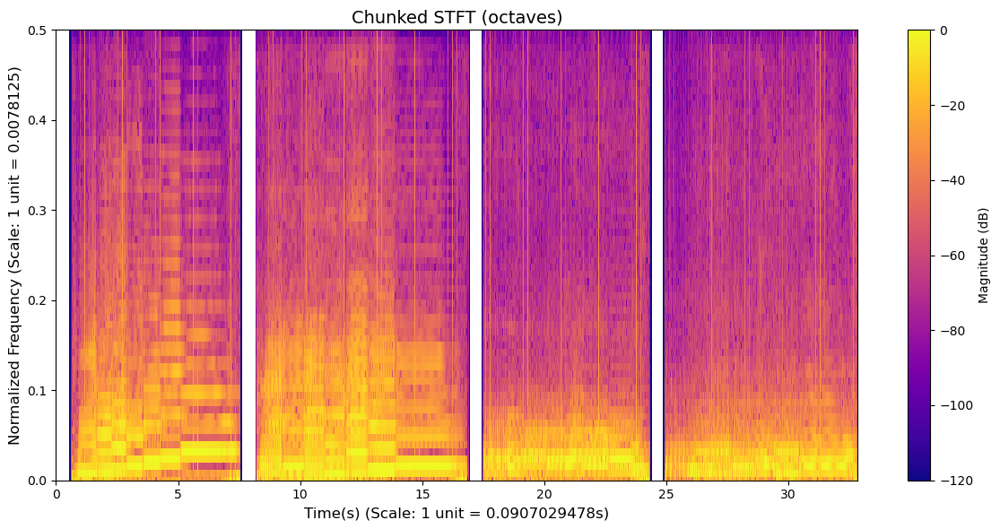

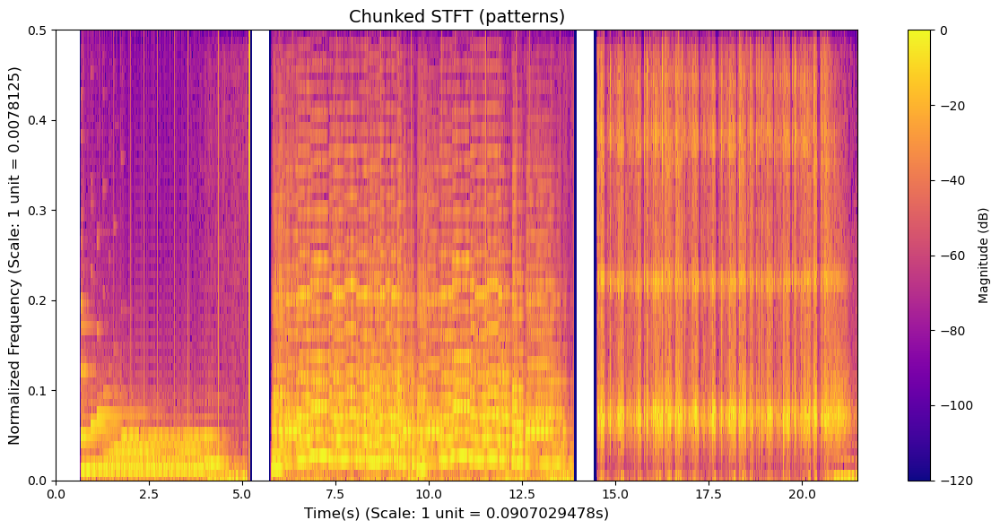

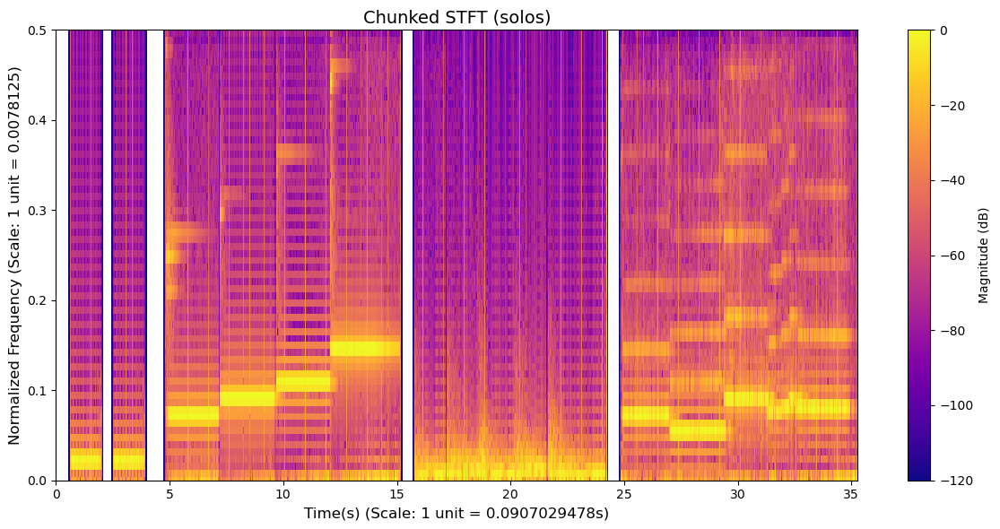

In [32]:
for signal_name, signal_array in signals_data.items():
    signal = signal_array
    chunk_size = 2000
    nfft = 128
    window = windows.bartlett(128)
    n_samples = len(signal)
    global_max = np.max(np.abs(signal))

    step = chunk_size
    num_chunks = (n_samples) // step

    tfr_all = []

    for i in range(num_chunks):
        start = i * step
        end = start + chunk_size
        if end > n_samples:
            break
        x_chunk = signal[start:end]

        stft = ShortTimeFourierTransform(x_chunk, fwindow=window, n_fbins=nfft)
        stft.run()

        S = np.abs(stft.tfr)
        max_val = np.max(S)
        S_dB = 20 * np.log10(S /max_val+ 1e-6)

        tfr_all.append(S_dB)  

    S_full = np.hstack(tfr_all)
    F = np.linspace(0, 1, S_full.shape[0])
    T = np.arange(S_full.shape[1])/22050

    plt.figure(figsize=(12,6))
    plt.pcolormesh(T, F, S_full, shading='auto', cmap='plasma')
    plt.colorbar(label="Magnitude (dB)")
    plt.title(f"Chunked STFT ({signal_name})", fontsize=14)
    plt.xlabel("Time(s) (Scale: 1 unit = 0.0907029478s)", fontsize=12)
    plt.ylabel("Normalized Frequency (Scale: 1 unit = 0.0078125)", fontsize=12)
    plt.ylim(0, 0.5)
    plt.tight_layout()
    plt.savefig(f"music_{signal_name}_stft.png")
    plt.show()

/var/folders/lp/166gmbq56sb3m0xjhm19215w0000gn/T/ipykernel_27931/4039594992.py:26: RuntimeWarning: invalid value encountered in divide
  S_dB = 20 * np.log10(S /max_val+ 1e-6)


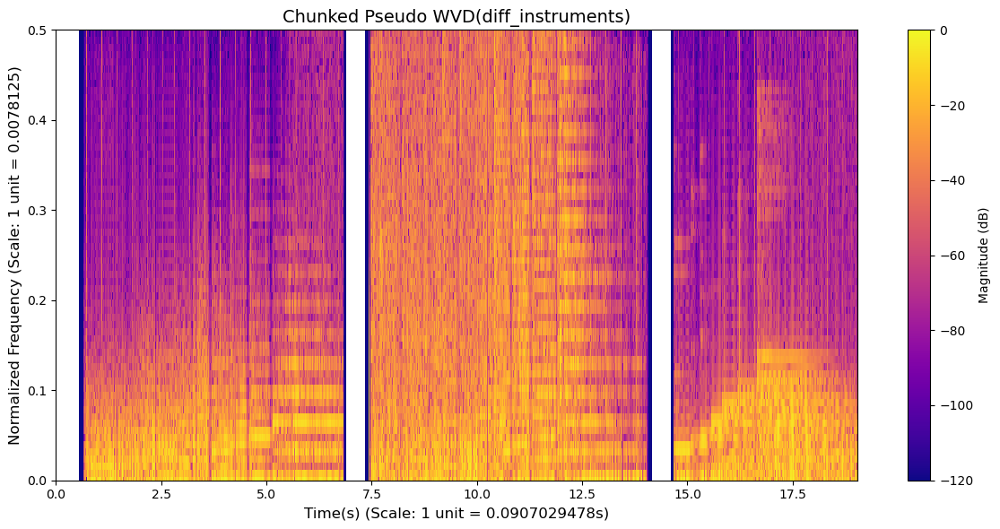

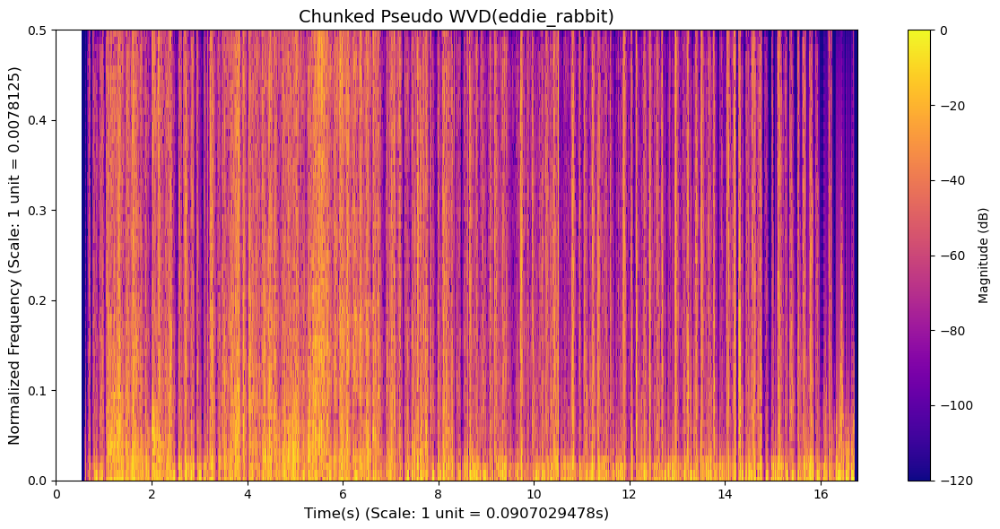

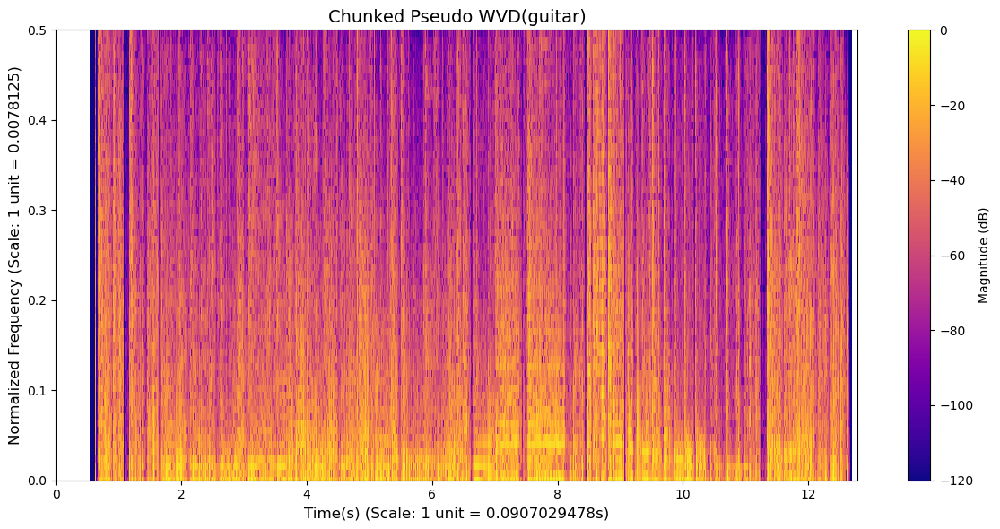

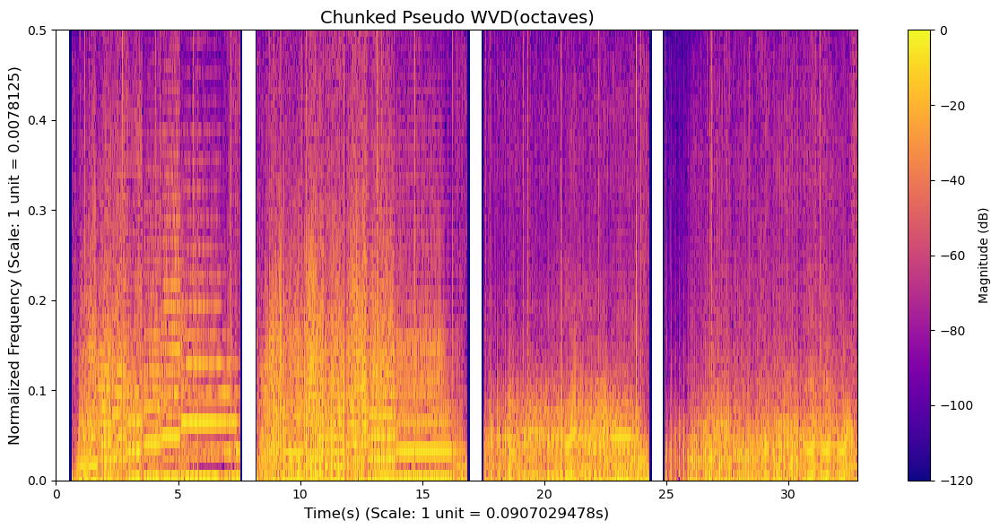

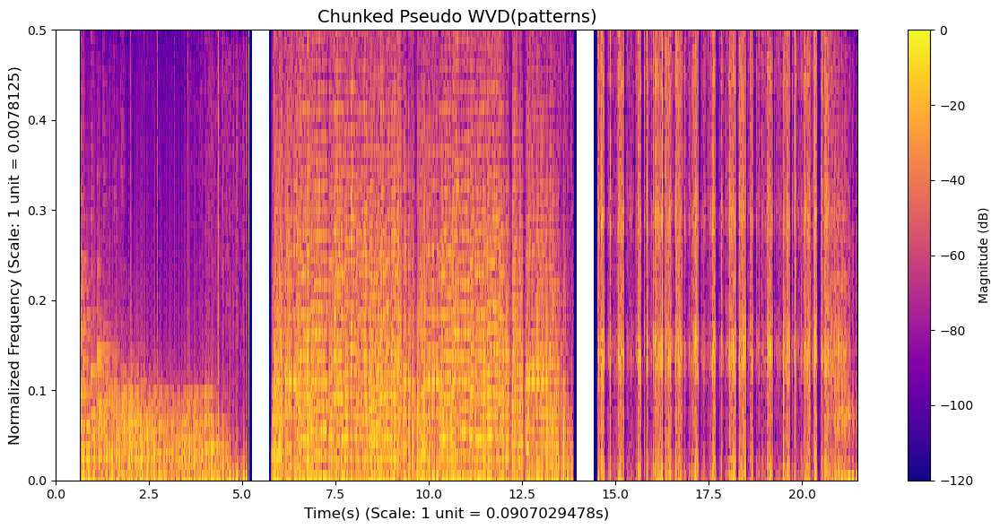

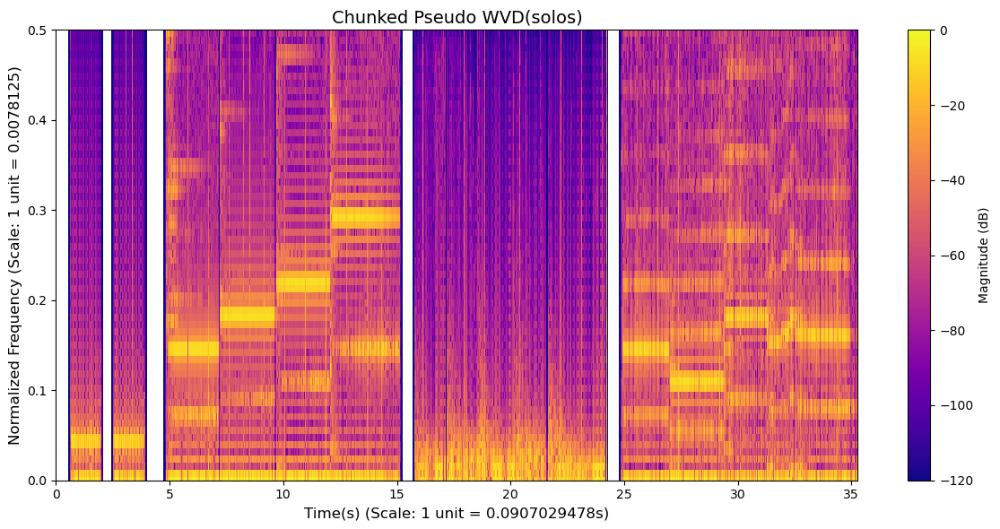

In [33]:
for signal_name, signal_array in signals_data.items():
    signal = signal_array
    chunk_size = 2000
    nfft = 128
    window = windows.bartlett(128)
    n_samples = len(signal)
    global_max = np.max(np.abs(signal))

    step = chunk_size
    num_chunks = (n_samples) // step

    tfr_all = []

    for i in range(num_chunks):
        start = i * step
        end = start + chunk_size
        if end > n_samples:
            break
        x_chunk = signal[start:end]

        pwvd = PseudoWignerVilleDistribution(x_chunk, fwindow=window, n_fbins=nfft)
        pwvd.run()

        S = np.abs(pwvd.tfr)
        max_val = np.max(S)
        S_dB = 20 * np.log10(S /max_val+ 1e-6)

        tfr_all.append(S_dB)  

    S_full = np.hstack(tfr_all)
    F = np.linspace(0, 1, S_full.shape[0])
    T = np.arange(S_full.shape[1])/22050

    plt.figure(figsize=(12,6))
    plt.pcolormesh(T, F, S_full, shading='auto', cmap='plasma')
    plt.colorbar(label="Magnitude (dB)")
    plt.title(f"Chunked Pseudo WVD({signal_name})", fontsize=14)
    plt.xlabel("Time(s) (Scale: 1 unit = 0.0907029478s)", fontsize=12)
    plt.ylabel("Normalized Frequency (Scale: 1 unit = 0.0078125)", fontsize=12)
    plt.ylim(0, 0.5)
    plt.tight_layout()
    plt.savefig(f"music_{signal_name}_pwvd.png")
    plt.show()

#### Problem 2e: Radar_Demo

In [62]:
radar_demo4_data = sio.loadmat('Dataset_for_A3/RADAR_Demo/Demo4.mat')
radar_demo5_data = sio.loadmat('Dataset_for_A3/RADAR_Demo/Demo5.mat')

radar_demo4_data = radar_demo4_data['samples'].T.squeeze()
radar_demo5_data = radar_demo5_data['samples'].T.squeeze()

radar_signals_data = {
    'radar_demo4': radar_demo4_data,
    'radar_demo5': radar_demo5_data
}

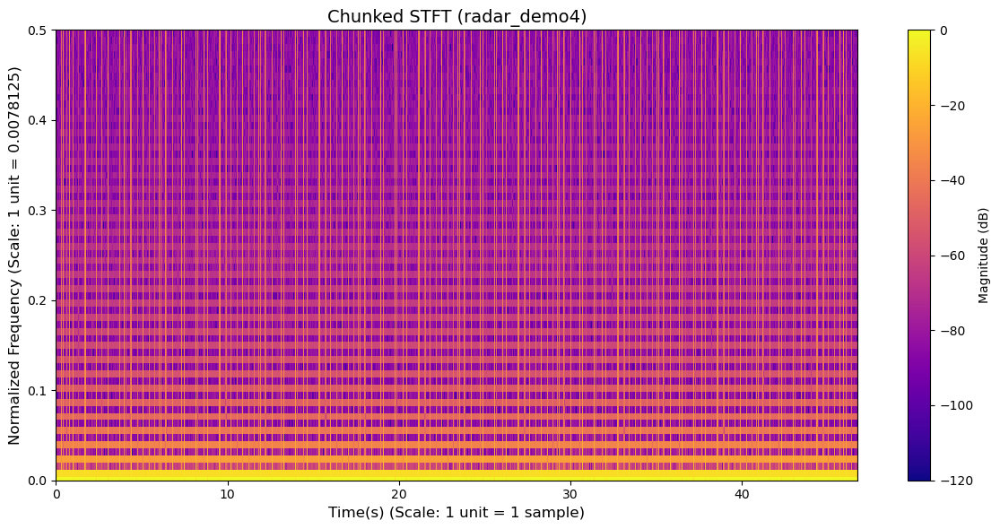

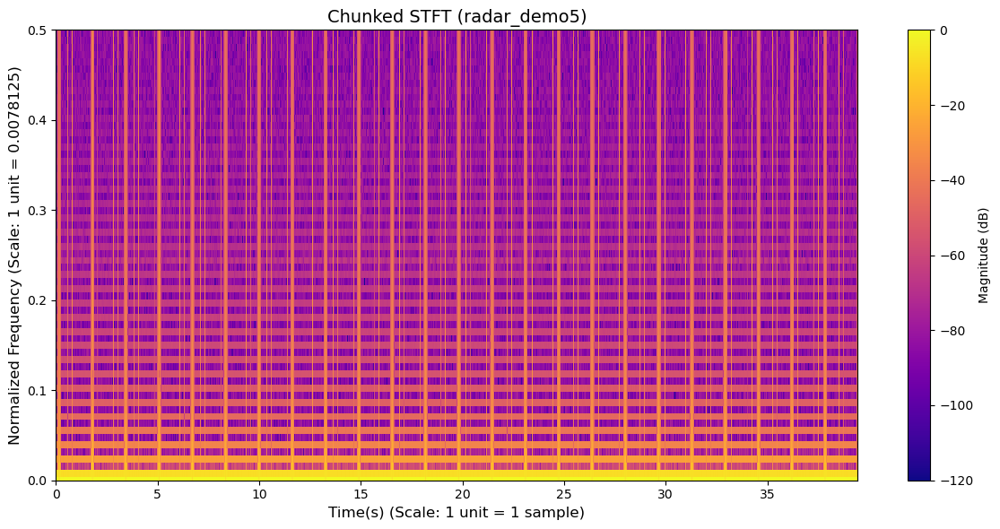

In [63]:
for signal_name, signal_array in radar_signals_data.items():
    signal = signal_array
    chunk_size = 1000
    nfft = 128
    window = windows.bartlett(128)
    n_samples = len(signal)
    global_max = np.max(np.abs(signal))

    step = chunk_size
    num_chunks = (n_samples) // step

    tfr_all = []

    for i in range(num_chunks):
        start = i * step
        end = start + chunk_size
        if end > n_samples:
            break
        x_chunk = signal[start:end]

        stft = ShortTimeFourierTransform(x_chunk, fwindow=window, n_fbins=nfft)
        stft.run()

        S = np.abs(stft.tfr)
        max_val = np.max(S)
        S_dB = 20 * np.log10(S /max_val+ 1e-6)

        tfr_all.append(S_dB)  

    S_full = np.hstack(tfr_all)
    F = np.linspace(0, 1, S_full.shape[0])
    T = np.arange(S_full.shape[1])

    plt.figure(figsize=(12,6))
    plt.pcolormesh(T, F, S_full, shading='auto', cmap='plasma')
    plt.colorbar(label="Magnitude (dB)")
    plt.title(f"Chunked STFT ({signal_name})", fontsize=14)
    plt.xlabel("Time(s) (Scale: 1 unit = 1 sample)", fontsize=12)
    plt.ylabel("Normalized Frequency (Scale: 1 unit = 0.0078125)", fontsize=12)
    plt.ylim(0, 0.5)
    plt.tight_layout()
    plt.savefig(f"{signal_name}_stft.png")
    plt.show()

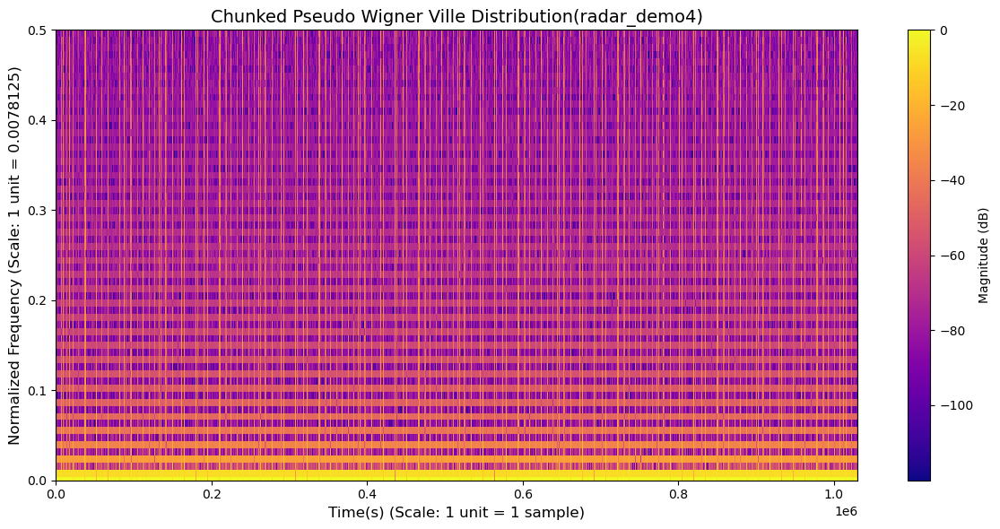

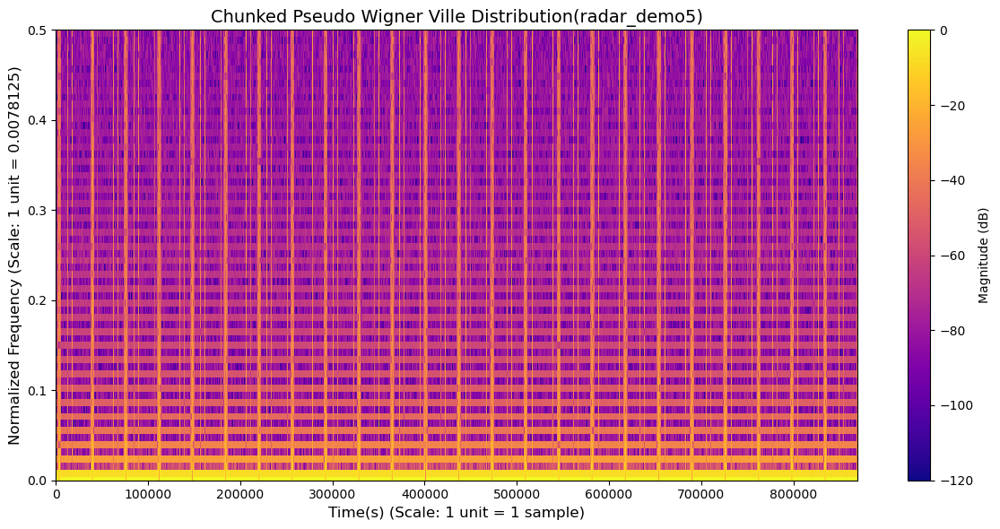

In [65]:
for signal_name, signal_array in radar_signals_data.items():
    signal = signal_array
    chunk_size = 1000
    nfft = 128
    window = windows.bartlett(128)
    n_samples = len(signal)
    global_max = np.max(np.abs(signal))

    step = chunk_size
    num_chunks = (n_samples) // step

    tfr_all = []

    for i in range(num_chunks):
        start = i * step
        end = start + chunk_size
        if end > n_samples:
            break
        x_chunk = signal[start:end]

        pwvd = PseudoWignerVilleDistribution(x_chunk, fwindow=window, n_fbins=nfft)
        pwvd.run()

        S = np.abs(pwvd.tfr)
        max_val = np.max(S)
        S_dB = 20 * np.log10(S /max_val+ 1e-6)

        tfr_all.append(S_dB)  

    S_full = np.hstack(tfr_all)
    F = np.linspace(0, 1, S_full.shape[0])
    T = np.arange(S_full.shape[1])

    plt.figure(figsize=(12,6))
    plt.pcolormesh(T, F, S_full, shading='auto', cmap='plasma')
    plt.colorbar(label="Magnitude (dB)")
    plt.title(f"Chunked Pseudo Wigner Ville Distribution({signal_name})", fontsize=14)
    plt.xlabel("Time(s) (Scale: 1 unit = 1 sample)", fontsize=12)
    plt.ylabel("Normalized Frequency (Scale: 1 unit = 0.0078125)", fontsize=12)
    plt.ylim(0, 0.5)
    plt.tight_layout()
    plt.savefig(f"{signal_name}_pwvd.png")
    plt.show()

#### Problem 2f: Audio from Timit

In [6]:
signal_sa1 = librosa.load("Dataset_for_A3/Speech_from_TIMIT/sa1.wav")
signal_sa2 = librosa.load("Dataset_for_A3/Speech_from_TIMIT/sa2.wav")
signal_sx204 = librosa.load("Dataset_for_A3/Speech_from_TIMIT/sx204.wav")

timit_signals_data = {
    'timit_sa1': signal_sa1[0],
    'timit_sa2': signal_sa2[0],
    'timit_sx204': signal_sx204[0],
}

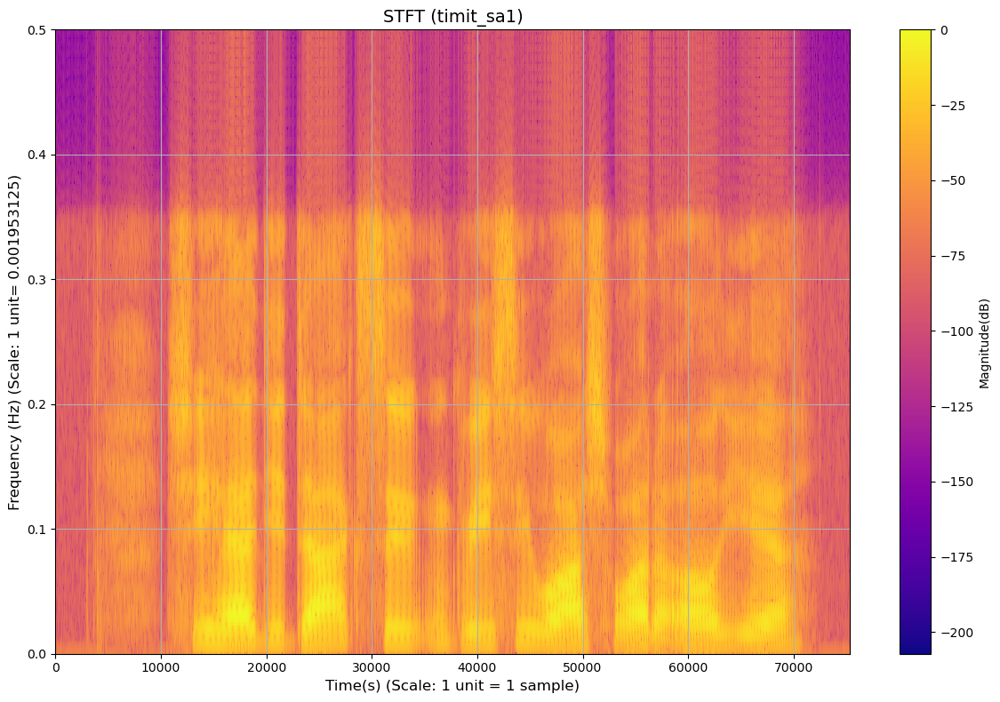

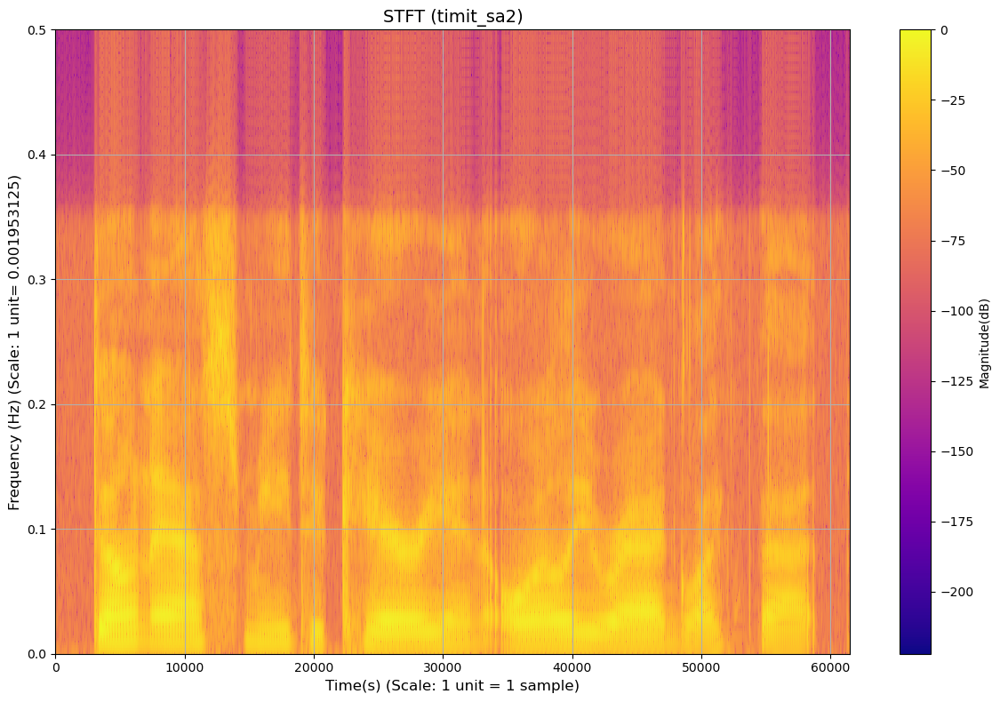

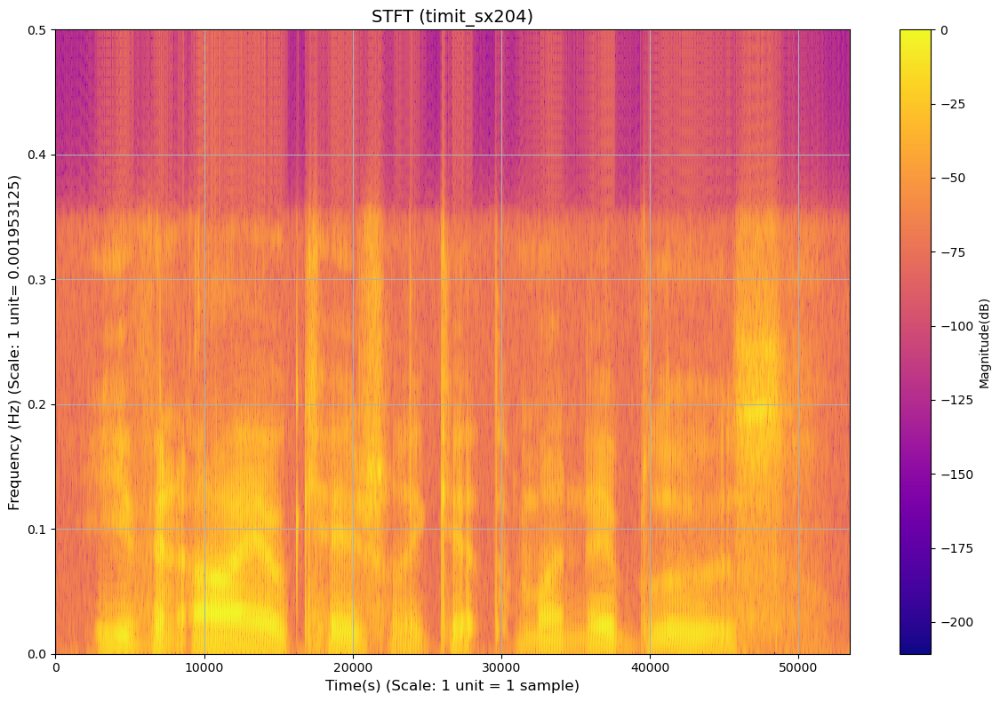

In [7]:
for signal_name, signal_array in timit_signals_data.items():
    stft = ShortTimeFourierTransform(signal_array, n_fbins= 512,fwindow=np.bartlett(128))
    stft.run()

    S = np.abs(stft.tfr)
    F = np.linspace(0, 1, S.shape[0])
    T = np.arange(S.shape[1])

    S_dB = 20 * np.log10(S / np.max(S) + 1e-12) 

    plt.figure(figsize=(12,8))
    plt.pcolormesh(T, F, S_dB, shading = 'auto', cmap = 'plasma')
    plt.colorbar(label = "Magnitude(dB)")
    plt.title(f"STFT ({signal_name})", fontsize = 14)
    plt.xlabel("Time(s) (Scale: 1 unit = 1 sample)", fontsize = 12)
    plt.ylabel("Frequency (Hz) (Scale: 1 unit= 0.001953125)", fontsize = 12)
    plt.ylim(0, 0.5)
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f"{signal_name}_stft.png")
    plt.show()

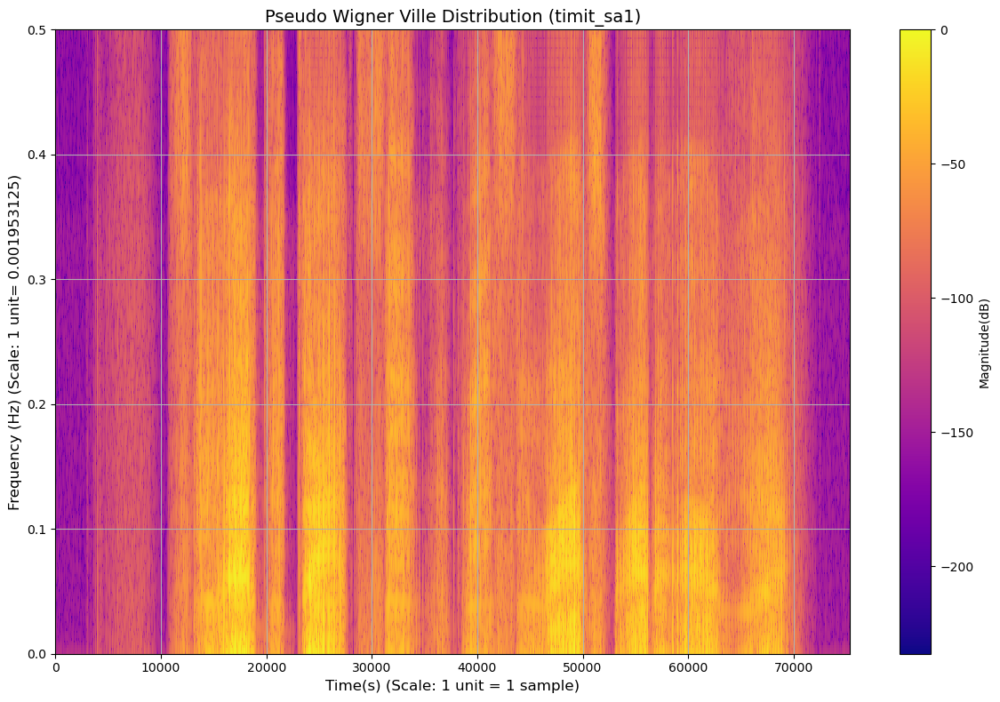

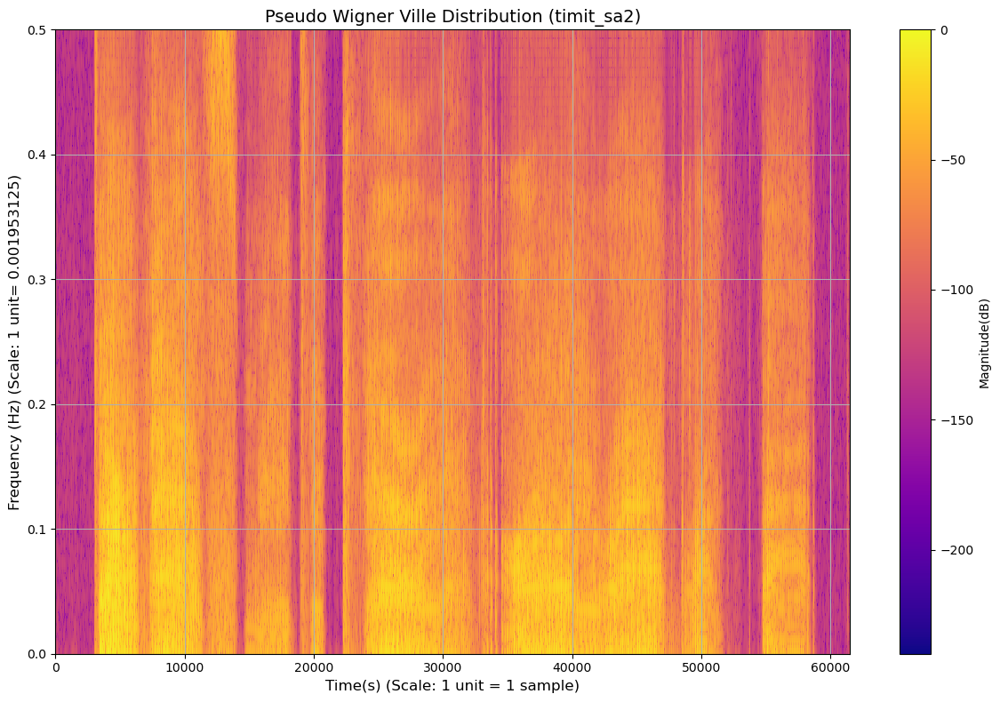

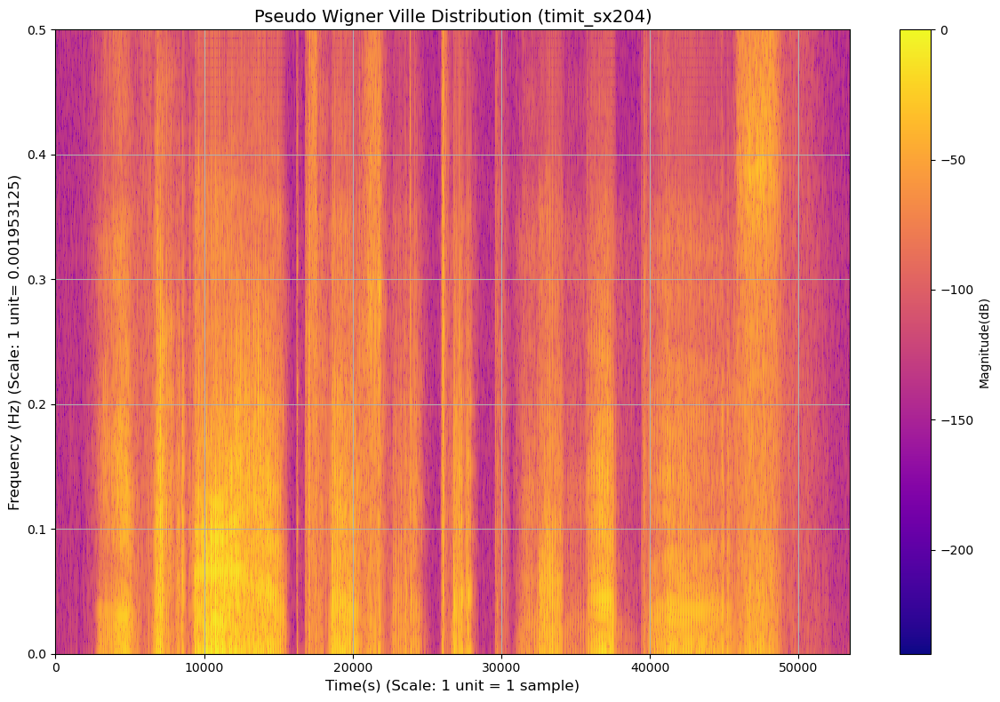

In [8]:
for signal_name, signal_array in timit_signals_data.items():
    pwvd = PseudoWignerVilleDistribution(signal_array, n_fbins= 512,fwindow=np.bartlett(128))
    pwvd.run()

    S = np.abs(pwvd.tfr)
    F = np.linspace(0, 1, S.shape[0])
    T = np.arange(S.shape[1])

    S_dB = 20 * np.log10(S / np.max(S) + 1e-12) 

    plt.figure(figsize=(12,8))
    plt.pcolormesh(T, F, S_dB, shading = 'auto', cmap = 'plasma')
    plt.colorbar(label = "Magnitude(dB)")
    plt.title(f"Pseudo Wigner Ville Distribution ({signal_name})", fontsize = 14)
    plt.xlabel("Time(s) (Scale: 1 unit = 1 sample)", fontsize = 12)
    plt.ylabel("Frequency (Hz) (Scale: 1 unit= 0.001953125)", fontsize = 12)
    plt.ylim(0, 0.5)
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f"{signal_name}_pwvd.png")
    plt.show()